In [3]:
import pandas as pd
import numpy as np
import scipy as sp
import re
import matplotlib.pyplot as plt
import string
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


df=pd.read_csv('/content/Rafsan TCB Youtube comment vid.csv')

import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px


from wordcloud import WordCloud
import nltk
import re
import string
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer


stop_words = stopwords.words()


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5460 entries, 0 to 5459
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   User     5449 non-null   object
 1   Comment  5154 non-null   object
dtypes: object(2)
memory usage: 85.4+ KB


In [5]:
df.describe().T

,count,unique,top,freq
User,5449,2368,Ahmed Faruk,39
Comment,5154,2308,️,29


In [6]:
df.fillna(0, inplace = True)
df.head
#convert float value to string
df['Comment'] = df['Comment'].astype(str) 
df.dtypes

User       object
Comment    object
dtype: object

In [7]:
def cleanTxt(df): 
  number=re.sub("[^a-zA-Z]","",str(string))      # Replace all non-letters with spaces
  df = re.sub(r'@[A-Za-z0-9]+', '', df) #Removing mentions
  df = re.sub(r'#[A-Za-z0-9]+', '', df)  #Removing hastags
  df = re.sub(r'RT[\s]+', '', df)   #Removing RTs
  df = re.sub(r'https?:\/\/\S+', '', df) #Removing URLs (generally promotional posts)
  return df
  # Define function to clean the text data
def cleanTxt(text):
    text = re.sub('@[A-Za-z0-9_]+', '', text) # Remove @mentions
    text = re.sub('#', '', text) # Remove hastags
    text = re.sub('RT[\s]+', '', text) # Remove retweets
    text = re.sub('https?:\/\/\S+', '', text) # Remove hyperlinks
    text = re.sub('[^a-zA-Z]', ' ', text) # Replace non-letters with spaces
    text = re.sub('\s+', ' ', text) # Remove extra spaces
    text = text.lower() # Convert text to lowercase
    return text
    words = text.split() # Split the text into words
    words = list(set(words)) # Remove duplicates
    
    return ' '.join(words) # Join the words back into a string
df['Comment'] = df['Comment'].apply(cleanTxt)
df              

,User,Comment
0,Rafsan TheChotoBhai,i got my money back the next day guess how
1,Tamal Tausif,we gotta support this man he is literally repr...
2,Mahir Tazwar,the production quality in this is insane reall...
3,Tamal Tausif,this is on whole another level had so much fun...
4,Siam Hoque,decent presentation and honest review this is ...
...,...,...
5455,The SS07 Star • 2.5M views •1 days ago \n ...,love you vai
5456,SAKIB HASSAN,nice brother
5457,al amin,
5458,GAMING LOVERS,love you vai


In [8]:
from textblob import TextBlob
#Function for getting subjectivity
def getSubjectivity(Review):
  return TextBlob(Review).sentiment.subjectivity

#Function for getting polarity
def getPolarity(Review):
  return TextBlob(Review).sentiment.polarity

#Creating new columns
df['Subjectivity'] = df['Comment'].apply(getSubjectivity)
df['Polarity'] = df['Comment'].apply(getPolarity)
df
     

,User,Comment,Subjectivity,Polarity
0,Rafsan TheChotoBhai,i got my money back the next day guess how,0.000000,0.000000
1,Tamal Tausif,we gotta support this man he is literally repr...,0.687500,0.337500
2,Mahir Tazwar,the production quality in this is insane reall...,1.000000,-0.100000
3,Tamal Tausif,this is on whole another level had so much fun...,0.360000,0.340000
4,Siam Hoque,decent presentation and honest review this is ...,0.783333,0.383333
...,...,...,...,...
5455,The SS07 Star • 2.5M views •1 days ago \n ...,love you vai,0.600000,0.500000
5456,SAKIB HASSAN,nice brother,1.000000,0.600000
5457,al amin,,0.000000,0.000000
5458,GAMING LOVERS,love you vai,0.600000,0.500000


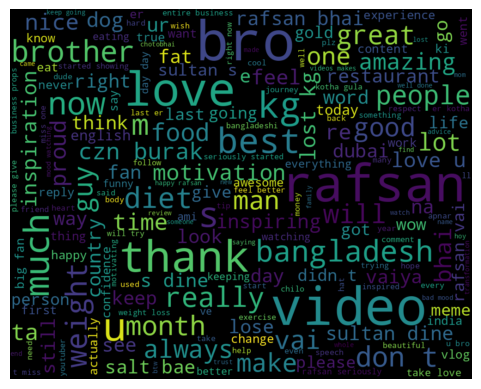

In [9]:
from wordcloud import WordCloud 
# Plot the Word Cloud
allWords = ' '.join([comnt for comnt in df['Comment']])
wordCloud = WordCloud(width =1000, height =800, random_state = 25, max_font_size = 119).generate(allWords)

plt.imshow(wordCloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [10]:
def getAnalysis(score):
  if score < 0:
    return 'Negative'
  elif score == 0:
    return 'Neutral'
  else:
    return 'Positive'
df['Class'] = df['Polarity'].apply(getAnalysis)

df

,User,Comment,Subjectivity,Polarity,Class
0,Rafsan TheChotoBhai,i got my money back the next day guess how,0.000000,0.000000,Neutral
1,Tamal Tausif,we gotta support this man he is literally repr...,0.687500,0.337500,Positive
2,Mahir Tazwar,the production quality in this is insane reall...,1.000000,-0.100000,Negative
3,Tamal Tausif,this is on whole another level had so much fun...,0.360000,0.340000,Positive
4,Siam Hoque,decent presentation and honest review this is ...,0.783333,0.383333,Positive
...,...,...,...,...,...
5455,The SS07 Star • 2.5M views •1 days ago \n ...,love you vai,0.600000,0.500000,Positive
5456,SAKIB HASSAN,nice brother,1.000000,0.600000,Positive
5457,al amin,,0.000000,0.000000,Neutral
5458,GAMING LOVERS,love you vai,0.600000,0.500000,Positive


In [11]:
#sentiment count: 
df['Class'].value_counts()

Neutral     3110
Positive    2122
Negative     228
Name: Class, dtype: int64

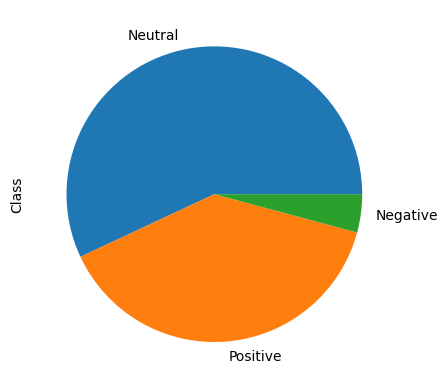

In [12]:
df['Class'].value_counts().plot(kind='pie')
plt.show()

In [13]:
df['Comment'].value_counts()

                                                                                                                                                                                                          1341
rafsan bhai i don t miss one of your videos i like your video very much when i m in a bad mood watching your videos makes me feel better as a fan of yours please give me a reply i will be very happy      23
wow                                                                                                                                                                                                         21
rafsan seriously started showing them memes while they are about to lose their entire business props to that guys for keeping his cool                                                                      21
nice                                                                                                                                                                        

<Axes: >

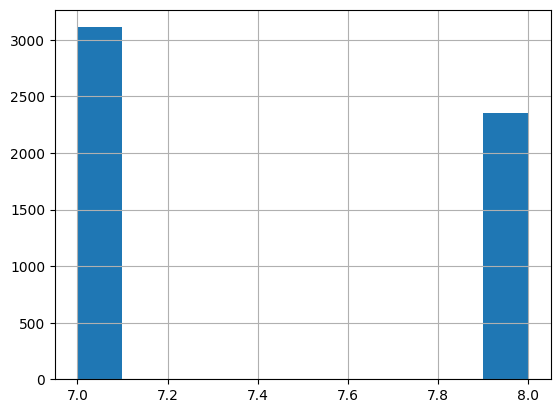

In [14]:
df['Class'].str.len().hist()

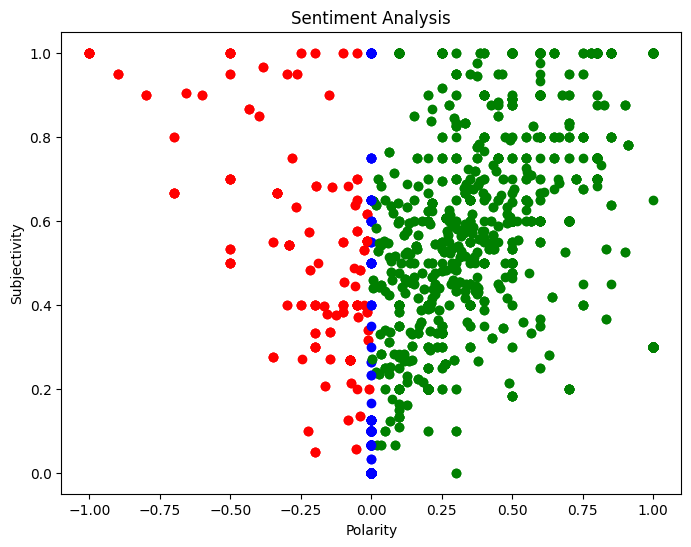

In [15]:
plt.figure(figsize=(8,6))
for i in range(0, df.shape[0]):
	if df['Class'][i]=='Neutral':
 		 plt.scatter(df['Polarity'][i], df['Subjectivity'][i], color='Blue')
	elif df['Class'][i]=='Positive':
 		 plt.scatter(df['Polarity'][i], df['Subjectivity'][i], color='Green')
	else:
 		 plt.scatter(df['Polarity'][i], df['Subjectivity'][i], color='Red')

plt.title('Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()

In [16]:
# Get the percentage of positive comment
pcomment = df[df.Class == 'Positive']
pcomment = pcomment['Comment']
print(round((pcomment.shape[0]/df.shape[0]*100), 1),"%")

38.9 %


In [17]:
# Get the percentage of negative comment
ncomment = df[df.Class == 'Negative']
ncomment = ncomment['Comment']
print(round((ncomment.shape[0]/df.shape[0]*100), 1),"%")

4.2 %


In [18]:
nucomment = df[df.Class == 'Neutral']
nucomment = nucomment['Comment']
print(round((nucomment.shape[0]/df.shape[0]*100), 1),"%")

57.0 %


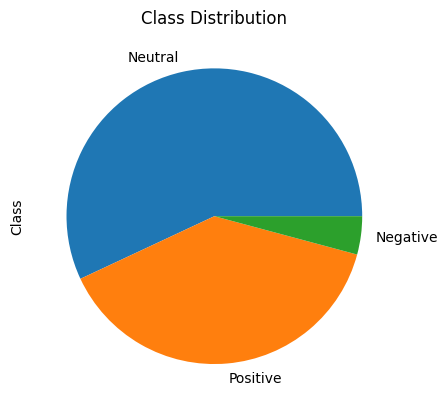

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
df['Class'].value_counts().plot(kind='pie')
plt.title('Class Distribution')
plt.show()


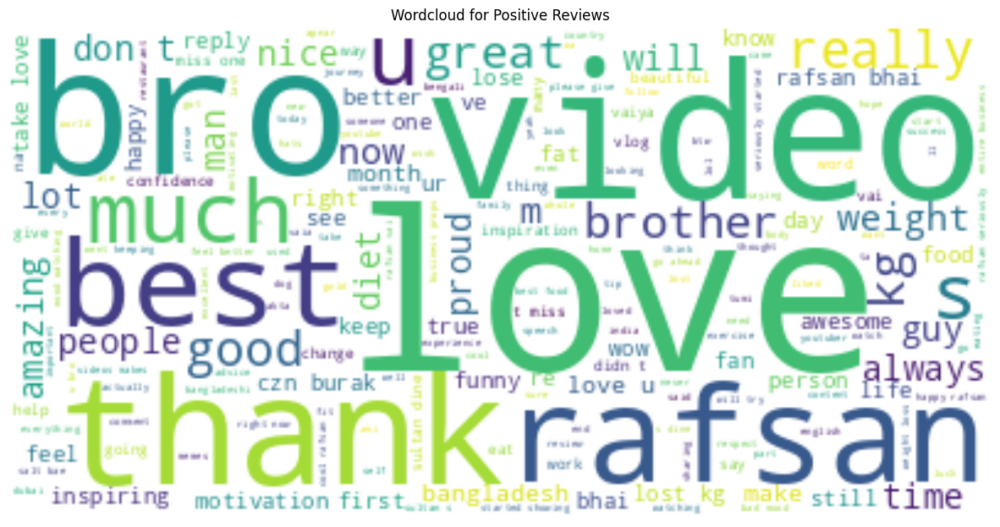

In [20]:
# from wordcloud import WordCloud
# text = " ".join(i for i in df[df['Comment']=='Positive']['Class'])
# wordcloud = WordCloud(background_color="white").generate(text)

# plt.figure( figsize=(15,10))
# plt.imshow(wordcloud, interpolation='bilinear')
# plt.axis("off")
# plt.title('wordcloud for positive review')
# plt.show()

from wordcloud import WordCloud

# Filter the dataframe by positive comments and concatenate them into a single string
text = " ".join(df.loc[df['Class'] == 'Positive', 'Comment'])

# Create the WordCloud object and generate the wordcloud
wordcloud = WordCloud(background_color="white").generate(text)

# Display the wordcloud using matplotlib
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Wordcloud for Positive Reviews')
plt.show()


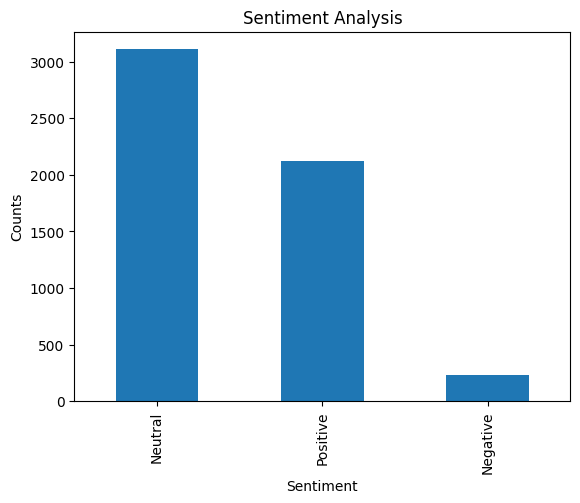

In [21]:
import matplotlib.pyplot as plt
import numpy as np
# Displaying the Sentiment Coutns
df['Class'].value_counts()
#plot and visualize the counts
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Counts')
df['Class'].value_counts().plot(kind='bar')

plt.show()

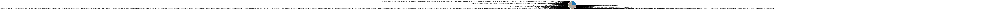

In [22]:
# import matplotlib.pyplot as plt

# # Displaying the Sentiment Counts
# df['Class'].value_counts()

# # plot and visualize the counts as a pie chart
# plt.title('Sentiment Analysis')
# df['Class'].value_counts().plot.pie()

# plt.show() 
df['Comment'].value_counts().plot(kind='pie')
plt.show()


## PREPROCESSING:

In [23]:
df.rename(columns={'review':'text'}, inplace = True)
df

,User,Comment,Subjectivity,Polarity,Class
0,Rafsan TheChotoBhai,i got my money back the next day guess how,0.000000,0.000000,Neutral
1,Tamal Tausif,we gotta support this man he is literally repr...,0.687500,0.337500,Positive
2,Mahir Tazwar,the production quality in this is insane reall...,1.000000,-0.100000,Negative
3,Tamal Tausif,this is on whole another level had so much fun...,0.360000,0.340000,Positive
4,Siam Hoque,decent presentation and honest review this is ...,0.783333,0.383333,Positive
...,...,...,...,...,...
5455,The SS07 Star • 2.5M views •1 days ago \n ...,love you vai,0.600000,0.500000,Positive
5456,SAKIB HASSAN,nice brother,1.000000,0.600000,Positive
5457,al amin,,0.000000,0.000000,Neutral
5458,GAMING LOVERS,love you vai,0.600000,0.500000,Positive


In [24]:
df['Comment']

0             i got my money back the next day guess how 
1       we gotta support this man he is literally repr...
2       the production quality in this is insane reall...
3       this is on whole another level had so much fun...
4       decent presentation and honest review this is ...
                              ...                        
5455                                         love you vai
5456                                         nice brother
5457                                                     
5458                                         love you vai
5459                                                     
Name: Comment, Length: 5460, dtype: object

In [25]:
df['Class']

0        Neutral
1       Positive
2       Negative
3       Positive
4       Positive
          ...   
5455    Positive
5456    Positive
5457     Neutral
5458    Positive
5459     Neutral
Name: Class, Length: 5460, dtype: object

In [26]:
def cleaning(text):        
    # converting to lowercase, removing URL links, special characters, punctuations...
    text = text.lower() # converting to lowercase
    text = re.sub('https?://\S+|www\.\S+', '', text) # removing URL links
    text = re.sub(r"\b\d+\b", "", text) # removing number 
    text = re.sub('<.*?>+', '', text) # removing special characters, 
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text) # punctuations
    text = re.sub('\n', '', text)
    text = re.sub('[’“”…]', '', text)
   
    #removing emoji: 
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    text = emoji_pattern.sub(r'', text)   

   # removing short form: 
    
    text=re.sub("isn't",'is not',text)
    text=re.sub("he's",'he is',text)
    text=re.sub("wasn't",'was not',text)
    text=re.sub("there's",'there is',text)
    text=re.sub("couldn't",'could not',text)
    text=re.sub("won't",'will not',text)
    text=re.sub("they're",'they are',text)
    text=re.sub("she's",'she is',text)
    text=re.sub("There's",'there is',text)
    text=re.sub("wouldn't",'would not',text)
    text=re.sub("haven't",'have not',text)
    text=re.sub("That's",'That is',text)
    text=re.sub("you've",'you have',text)
    text=re.sub("He's",'He is',text)
    text=re.sub("what's",'what is',text)
    text=re.sub("weren't",'were not',text)
    text=re.sub("we're",'we are',text)
    text=re.sub("hasn't",'has not',text)
    text=re.sub("you'd",'you would',text)
    text=re.sub("shouldn't",'should not',text)
    text=re.sub("let's",'let us',text)
    text=re.sub("they've",'they have',text)
    text=re.sub("You'll",'You will',text)
    text=re.sub("i'm",'i am',text)
    text=re.sub("we've",'we have',text)
    text=re.sub("it's",'it is',text)
    text=re.sub("don't",'do not',text)
    text=re.sub("that´s",'that is',text)
    text=re.sub("I´m",'I am',text)
    text=re.sub("it’s",'it is',text)
    text=re.sub("she´s",'she is',text)
    text=re.sub("he’s'",'he is',text)
    text=re.sub('I’m','I am',text)
    text=re.sub('I’d','I did',text)
    text=re.sub("he’s'",'he is',text)
    text=re.sub('there’s','there is',text)
    
     
    return text
    
dt = df['Comment'].apply(cleaning)

In [27]:
dt = pd.DataFrame(dt)  
dt['Comment']=df['Comment']
dt

,Comment
0,i got my money back the next day guess how
1,we gotta support this man he is literally repr...
2,the production quality in this is insane reall...
3,this is on whole another level had so much fun...
4,decent presentation and honest review this is ...
...,...
5455,love you vai
5456,nice brother
5457,
5458,love you vai


In [28]:
# remove stop word: 
dt['no_sw'] = dt['Comment'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [29]:
dt

,Comment,no_sw
0,i got my money back the next day guess how,money back day guess
1,we gotta support this man he is literally repr...,gotta support literally representing banglades...
2,the production quality in this is insane reall...,production quality insane proud rafsan
3,this is on whole another level had so much fun...,level fun watching wish grow upload
4,decent presentation and honest review this is ...,decent presentation honest review called justice
...,...,...
5455,love you vai,love
5456,nice brother,nice brother
5457,,
5458,love you vai,love


In [30]:
#Working with the most Frequent Words: 
from collections import Counter
cnt = Counter()
for text in dt["no_sw"].values:
    for word in text.split():
        cnt[word] += 1
cnt.most_common(10)
temp = pd.DataFrame(cnt.most_common(10))
temp.columns=['word', 'count']
temp

,word,count
0,rafsan,624
1,love,442
2,video,406
3,kg,235
4,weight,218
5,food,168
6,brother,161
7,bangladesh,145
8,diet,138
9,sultan,133


In [31]:
px.bar(temp, x="count", y="word", title='Commmon Words in Text', orientation='h', 
             width=700, height=700)


In [32]:
# Remove the most frequent words:
FREQWORDS = set([w for (w, wc) in cnt.most_common(10)])
def remove_freqwords(text):
    """custom function to remove the frequent words"""
    return " ".join([word for word in str(text).split() if word not in FREQWORDS])
dt["wo_stopfreq"] = dt["no_sw"].apply(lambda text: remove_freqwords(text))
dt.head()

,Comment,no_sw,wo_stopfreq
0,i got my money back the next day guess how,money back day guess,money back day guess
1,we gotta support this man he is literally repr...,gotta support literally representing banglades...,gotta support literally representing countries...
2,the production quality in this is insane reall...,production quality insane proud rafsan,production quality insane proud
3,this is on whole another level had so much fun...,level fun watching wish grow upload,level fun watching wish grow upload
4,decent presentation and honest review this is ...,decent presentation honest review called justice,decent presentation honest review called justice


In [33]:
dt['no_sw'].loc[5]

'today review international level brother quality editing scale bold brother love respect'

In [34]:
dt['wo_stopfreq'].loc[5]

'today review international level quality editing scale bold respect'

In [35]:
# Lemmatization: Lemmatization is converting the word to its base form or lemma by removing affixes from the inflected words. 
# It helps to create better features for machine learning and NLP models hence it is an important preprocessing step.

import nltk
nltk.download('wordnet')
wordnet_lem = WordNetLemmatizer()

dt['wo_stopfreq_lem'] = dt['wo_stopfreq'].apply(wordnet_lem.lemmatize)
dt

[nltk_data] Downloading package wordnet to /root/nltk_data...


,Comment,no_sw,wo_stopfreq,wo_stopfreq_lem
0,i got my money back the next day guess how,money back day guess,money back day guess,money back day guess
1,we gotta support this man he is literally repr...,gotta support literally representing banglades...,gotta support literally representing countries...,gotta support literally representing countries...
2,the production quality in this is insane reall...,production quality insane proud rafsan,production quality insane proud,production quality insane proud
3,this is on whole another level had so much fun...,level fun watching wish grow upload,level fun watching wish grow upload,level fun watching wish grow upload
4,decent presentation and honest review this is ...,decent presentation honest review called justice,decent presentation honest review called justice,decent presentation honest review called justice
...,...,...,...,...
5455,love you vai,love,,
5456,nice brother,nice brother,nice,nice
5457,,,,
5458,love you vai,love,,


## Tokenization

In [36]:
# create the cleaned data for the train-test split:
nb=dt.drop(columns=['wo_stopfreq_lem','no_sw', 'wo_stopfreq'])
# nb.columns=['sentiment','review']
nb = nb.rename(columns={'Class': 'sentiment', 'Comment': 'review'})
# nb.sentiment = [0 if each == "negative" else 1 for each in nb.sentiment]
nb

# # # create the cleaned data for the train-test split:
# # nb = dt.drop(columns=['wo_stopfreq_lem', 'no_sw', 'wo_stopfreq'])
# # nb = nb.rename(columns={'Class': 'sentiment', 'Comment': 'review'})
# nb['sentiment'] = nb['sentiment'].apply(lambda x: 0 if x == "Negative" else 1)



,review
0,i got my money back the next day guess how
1,we gotta support this man he is literally repr...
2,the production quality in this is insane reall...
3,this is on whole another level had so much fun...
4,decent presentation and honest review this is ...
...,...
5455,love you vai
5456,nice brother
5457,
5458,love you vai


In [37]:
tokenized_review = nb['review'].apply(lambda x: x.split())
tokenized_review.head(5)


0    [i, got, my, money, back, the, next, day, gues...
1    [we, gotta, support, this, man, he, is, litera...
2    [the, production, quality, in, this, is, insan...
3    [this, is, on, whole, another, level, had, so,...
4    [decent, presentation, and, honest, review, th...
Name: review, dtype: object

In [38]:
# from sklearn.feature_extraction.text import CountVectorizer
# from nltk.tokenize import RegexpTokenizer
# token = RegexpTokenizer(r'[a-zA-Z0-9]+')
# cv = CountVectorizer(stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
# text_counts = cv.fit_transform(nb['Comment'])
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer

token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv = CountVectorizer(stop_words='english',ngram_range=(1,1),tokenizer=token.tokenize)
text_counts = cv.fit_transform(nb['review'])


/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



## Train-test Split

In [39]:
from sklearn.model_selection import train_test_split
X=text_counts
y=nb['review']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20,random_state=30)

### 1) Complement NB model:

In [40]:
from sklearn.naive_bayes import ComplementNB
from sklearn.metrics import classification_report, confusion_matrix
CNB = ComplementNB()
CNB.fit(X_train, y_train)

from sklearn import metrics
predicted = CNB.predict(X_test)
accuracy_score = metrics.accuracy_score(predicted, y_test)

print('ComplementNB model accuracy is',str('{:04.2f}'.format(accuracy_score*100))+'%')
print('------------------------------------------------')
print('Confusion Matrix:')
print(pd.DataFrame(confusion_matrix(y_test, predicted)))
print('------------------------------------------------')
print('Classification Report:')
print(classification_report(y_test, predicted))


ComplementNB model accuracy is 62.36%
------------------------------------------------
Confusion Matrix:
     0    1    2    3    4    5    6    7    8    9    ...  861  862  863  \
0    255    0    0    0    0    0    0    0    0    0  ...    0    0    0   
1      0    1    0    0    0    0    0    0    0    0  ...    0    0    0   
2      0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
3      0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
4      0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
..   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
866    0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
867    0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
868    0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
869    0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
870    0    0    0    0    0    0    0    0    0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to cont

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



### 2) Mutilnominal NB model:

In [41]:
from sklearn.naive_bayes import MultinomialNB

MNB = MultinomialNB()
MNB.fit(X_train, y_train)

predicted = MNB.predict(X_test)
accuracy_score = metrics.accuracy_score(predicted, y_test)

print('MultinominalNB model accuracy is',str('{:04.2f}'.format(accuracy_score*100))+'%')
print('------------------------------------------------')
print('Confusion Matrix:')
print(pd.DataFrame(confusion_matrix(y_test, predicted)))
print('------------------------------------------------')
print('Classification Report:')
print(classification_report(y_test, predicted))

MultinominalNB model accuracy is 38.92%
------------------------------------------------
Confusion Matrix:
     0    1    2    3    4    5    6    7    8    9    ...  710  711  712  \
0    255    0    0    0    0    0    0    0    0    0  ...    0    0    0   
1      0    1    0    0    0    0    0    0    0    0  ...    0    0    0   
2      3    0    0    0    0    0    0    0    0    0  ...    0    0    0   
3      1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
4      2    0    0    0    0    0    0    0    0    0  ...    0    0    0   
..   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
715    1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
716    1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
717    0    0    0    0    0    0    0    0    0    0  ...    0    0    0   
718    1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
719    1    0    0    0    0    0    0    0   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to cont

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



### 3) Bernoulli NB model:

In [42]:
from sklearn.naive_bayes import BernoulliNB

BNB = BernoulliNB()
BNB.fit(X_train, y_train)

predicted = BNB.predict(X_test)
accuracy_score_bnb = metrics.accuracy_score(predicted,y_test)

print('BernoulliNB model accuracy = ' + str('{:4.2f}'.format(accuracy_score_bnb*100))+'%')
print('------------------------------------------------')
print('Confusion Matrix:')
print(pd.DataFrame(confusion_matrix(y_test, predicted)))
print('------------------------------------------------')
print('Classification Report:')
print(classification_report(y_test, predicted))

BernoulliNB model accuracy = 23.35%
------------------------------------------------
Confusion Matrix:
     0    1    2    3    4    5    6    7    8    9    ...  703  704  705  \
0    255    0    0    0    0    0    0    0    0    0  ...    0    0    0   
1      1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
2      3    0    0    0    0    0    0    0    0    0  ...    0    0    0   
3      1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
4      2    0    0    0    0    0    0    0    0    0  ...    0    0    0   
..   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
708    1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
709    1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
710    1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
711    1    0    0    0    0    0    0    0    0    0  ...    0    0    0   
712    1    0    0    0    0    0    0    0    0  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### Plot Confusion Matrices:
Plot confusion matrix for CNB, MNB, BNB model:

In [43]:
import sklearn
print(sklearn.__version__)

1.2.2


In [44]:
!pip install --upgrade scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [46]:
# # from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# # import warnings
# # warnings.filterwarnings("ignore")
# # k= [CNB, MNB, BNB]
# # for i in k: 
# #     plot_confusion_matrix(i, X_test, y_test)
# #     #confusion_matrix(i, y_test, predicted)  
# #     plt.title(i)
# #     plt.show()

# import matplotlib.pyplot as plt
# from sklearn.naive_bayes import ComplementNB, MultinomialNB, BernoulliNB
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# import warnings
# warnings.filterwarnings("ignore")

# k = [ComplementNB(), MultinomialNB(), BernoulliNB()]

# for clf in k:
#     clf.fit(X_train, y_train)
#     y_pred = clf.predict(X_test)
#     cm = confusion_matrix(y_test, y_pred)
#     disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["negative", "positive"])
#     disp.plot()
#     plt.title(str(clf))
#     plt.show()





## Trying different n-grams:

### a) Bigram: ngram_range = (2,2)

In [47]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

# Load data into a pandas dataframe
nb = pd.read_csv('/content/Rafsan TCB Youtube comment vid.csv')

# Drop rows with NaN values in the 'Comment' column
nb.dropna(subset=['Comment'], inplace=True)

# Tokenize and count n-grams
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv_twograms = CountVectorizer(stop_words='english',ngram_range = (2,2),tokenizer = token.tokenize)
text_counts_twograms = cv_twograms.fit_transform(nb['Comment'])

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(text_counts_twograms, nb['Comment'], test_size=0.20,random_state=30)

# Train and evaluate the model
MNB = MultinomialNB()
MNB.fit(X_train, y_train)
predicted = MNB.predict(X_test)
accuracy_score = metrics.accuracy_score(predicted, y_test)
print('model accuracy is',str('{:04.2f}'.format(accuracy_score*100))+'%')



model accuracy is 29.68%


### b) Trigram: ngram_range= (3,3)¶

In [48]:
nb = pd.read_csv('/content/Rafsan TCB Youtube comment vid.csv',encoding='latin-1')
nb = nb.dropna()
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv_threegrams = CountVectorizer(stop_words='english',ngram_range = (3,3),tokenizer = token.tokenize)
text_counts_threegrams = cv_threegrams.fit_transform(nb['Comment'])

X_train, X_test, y_train, y_test = train_test_split(text_counts_threegrams, nb['Comment'], test_size=0.20,random_state=30)

MNB = MultinomialNB()
MNB.fit(X_train, y_train)
predicted = MNB.predict(X_test)
accuracy_score = metrics.accuracy_score(predicted, y_test)
print('model accuracy is',str('{:04.2f}'.format(accuracy_score*100))+'%')

model accuracy is 24.93%
